In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
!nvidia-smi

Wed May 17 08:26:28 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

- pytorch 1.13+ CUDA 116 환경으로 Colab 커널 downgrade

In [4]:
!pip install torch==1.13.0+cu116 torchvision==0.14.0+cu116 --extra-index-url https://download.pytorch.org/whl/cu116

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu116
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 GB 471.0 kB/s eta 0:00:000:01m00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.2/24.2 MB 46.2 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: torch
    Found existing installation: torch 2.0.0
    Uninstalling torch-2.0.0:
      Successfully uninstalled torch-2.0.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.15.1
    Uninstalling torchvision-0.15.1:
      Successfully uninstalled torchvision-0.15.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchdata 0.6.0 requires torch==2.0.0, but you have torch 1.13.0+cu116 which is incompatible.


- Install MMCV using MIM

In [5]:
!pip3 install openmim
!mim install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu116/torch1.13/index.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 3.7 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu116/torch1.13/index.html, https://download.openmmlab.com/mmcv/dist/cu116/torch1.13.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 MB 7.7 MB/s eta 0:00:00:00:0100:01


- Install MMDetection from the source

In [6]:
# mmdetection 2.x branch 로 설치
!git clone --branch 2.x https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 36083, done.
remote: Counting objects: 100% (737/737), done.
remote: Compressing objects: 100% (372/372), done.
remote: Total 36083 (delta 377), reused 626 (delta 356), pack-reused 35346
Receiving objects: 100% (36083/36083), 52.11 MiB | 27.71 MiB/s, done.
Resolving deltas: 100% (25315/25315), done.
/kaggle/working/mmdetection
Obtaining file:///kaggle/working/mmdetection
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp310-cp310-linux_x86_64.whl size=102202 sha256=025a7c246634003d94d8ba953e1aa049e82acdaaa5ed1783e7a60a9a1e1f3ee7
  Stored in directory: /root/.cache/pip/wheels/58/e6/f9/f87c8f8be098b51b616871315318329cae12cdb618f4caac93
Successfully built pycocotools
  Running setup.py develop for mmdet


- Verification

In [7]:
import mmdet
print(mmdet.__version__)

2.28.2


/opt/conda/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


- Inference

In [8]:
!mim download mmdet --config yolov3_mobilenetv2_320_300e_coco --dest .

/opt/conda/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
processing yolov3_mobilenetv2_320_300e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MiB 9.8 MB/s eta 0:00:0000:0100:01
Successfully downloaded yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth to /kaggle/working/mmdetection
Successfully dumped yolov3_mobilenetv2_320_300e_coco.py to /kaggle/working/mmdetection


In [9]:
from mmdet.apis import init_detector, inference_detector

config_file = 'yolov3_mobilenetv2_320_300e_coco.py'
checkpoint_file = 'yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth'
model = init_detector(config_file, checkpoint_file, device='cpu')  # or device='cuda:0'
result = inference_detector(model, 'demo/demo.jpg')
len(result)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


load checkpoint from local path: yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth


80

- kaggle에서 drive 연결

In [10]:
!pip install gdown

In [11]:
!gdown --id 1-_qFuO1IbV6a0HkbkXi81xxUB1PxxUoB

/opt/conda/lib/python3.10/site-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (uriginal): https://drive.google.com/uc?id=1-_qFuO1IbV6a0HkbkXi81xxUB1PxxUoB
From (redirected): https://drive.google.com/uc?id=1-_qFuO1IbV6a0HkbkXi81xxUB1PxxUoB&confirm=t&uuid=5f3e9b2f-ad42-4305-bf0d-21b3fc2f7162
To: /kaggle/working/mmdetection/epoch_5.pth
100%|█████████████████████████████████████████| 504M/504M [00:02<00:00, 203MB/s]


In [12]:
import os
import glob
import shutil
import pandas as pd
import mmcv
import matplotlib.pyplot as plt
import cv2

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.coco import CocoDataset
from mmcv import Config

# Train A Detector on A Customized Dataset

**LISA Traffic Light Dataset 다운로드**

In [9]:
# !pip install kaggle
# from google.colab import files
# files.upload()
# !mkdir -p ~/.kaggle
# !cp kaggle.json ~/.kaggle/

# # permmision warning 방지
# !chmod 600 ~/.kaggle/kaggle.json

# # download the data
# !kaggle datasets download -d mbornoe/lisa-traffic-light-dataset

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/













Saving kaggle.json to kaggle.json


 99% 4.19G/4.21G [00:32<00:00, 304MB/s]

100% 4.21G/4.21G [00:32<00:00, 138MB/s]


In [10]:
# !mkdir lisa-traffic-light-dataset
# # unzip
# !unzip -q lisa-traffic-light-dataset.zip -d lisa-traffic-light-dataset

**Dataset의 디렉토리 구조 보기**

In [11]:
# # install tree first
# !apt-get -q install tree

Reading package lists...

Building dependency tree...

Reading state information...

The following NEW packages will be installed:

  tree

0 upgraded, 1 newly installed, 0 to remove and 24 not upgraded.

Need to get 43.0 kB of archives.

After this operation, 115 kB of additional disk space will be used.

Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tree amd64 1.8.0-1 [43.0 kB]

Fetched 43.0 kB in 38s (1,147 B/s)

Selecting previously unselected package tree.

(Reading database ... 122520 files and directories currently installed.)

Preparing to unpack .../tree_1.8.0-1_amd64.deb ...

Unpacking tree (1.8.0-1) ...

Setting up tree (1.8.0-1) ...

Processing triggers for man-db (2.9.1-1) ...


In [13]:
!pwd

/kaggle/working/mmdetection


In [ ]:
# !tree ./lisa-traffic-light-dataset/Annotations

## 이미지 폴더 생성
- dayTrain, nightTrain : Train
- daySequence1, nightSequence1 : valid
- daySequence2, nightSequence2 : test

**이미지 파일 갯수**

In [14]:
def count_files(path):
    count = 0
    for root, dirs, files in os.walk(path):
        count += len(files)
    return count

In [15]:
# # dayTrain img 파일
# path = './lisa-traffic-light-dataset/dayTrain/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [16]:
# # nightTrain img 파일
# path = './lisa-traffic-light-dataset/nightTrain/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [17]:
# # daySequence1 img 파일
# path = './lisa-traffic-light-dataset/daySequence1/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [18]:
# # nightSequence1 img 파일
# path = './lisa-traffic-light-dataset/nightSequence1/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [19]:
# # daySequence2 img 파일
# path = './lisa-traffic-light-dataset/daySequence2/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [20]:
# # nightSequence2 img 파일
# path = './lisa-traffic-light-dataset/nightSequence2/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

**train, valid, test 이미지 폴더 만들기**

In [15]:
!mkdir lisa_train
!mkdir lisa_val
!mkdir lisa_test

## annotation csv 파일 합치기

In [16]:
DATA_PATH = '/kaggle/input/lisa-traffic-light-dataset/'

DAY_TRAIN_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/dayTrain/'
NIGHT_TRAIN_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/nightTrain/'

import os

os.listdir(DAY_TRAIN_PATH)

from tqdm import tqdm

train_day = []
for clipName in tqdm(sorted(os.listdir(DAY_TRAIN_PATH))):
    if 'dayClip' not in clipName:
        continue
    df = pd.read_csv(os.path.join(DAY_TRAIN_PATH, clipName, 'frameAnnotationsBOX.csv'), sep=';')
    df = df[df['Origin frame number'] % 10 == 0]
    train_day.append(df)
    
train_day_df = pd.concat(train_day, axis=0)
train_day_df['isNight'] = 0
    
train_night = []
for clipName in tqdm(sorted(os.listdir(NIGHT_TRAIN_PATH))):
    if 'nightClip' not in clipName:
        continue
    df = pd.read_csv(os.path.join(NIGHT_TRAIN_PATH, clipName, 'frameAnnotationsBOX.csv'), sep=';')
    df = df[df['Origin frame number'] % 10 == 0]
    train_night.append(df)

train_night_df = pd.concat(train_night, axis=0)
train_night_df['isNight'] = 1 # 밤을 구분하기 위함

train_df = pd.concat([train_day_df, train_night_df], axis=0)
train_df = train_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    if isNight:
        return os.path.join(DATA_PATH, f'nightTrain/nightTrain/{clipName}/frames/{splitted[-1]}')
    else:
        return os.path.join(DATA_PATH, f'dayTrain/dayTrain/{clipName}/frames/{splitted[-1]}')

train_df['Filename'] = train_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'goLeft' in x['Annotation tag']:
        return 'goLeft'
    elif 'go' in x['Annotation tag']:
        return 'go'
    elif 'goForward' in x['Annotation tag']:
        return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
train_df['Annotation tag'] = train_df.apply(changeAnnotation, axis=1)

train_df.to_csv('training_data.csv', index=False)

print(f'Finished processing {train_df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
train_df.head()

100%|██████████| 5/5 [00:00<00:00, 38.88it/s]


Finished processing 5206 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number,isNight
0,/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg,go,698,333,710,358,0,0
1,/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg,go,846,391,858,411,0,0
20,/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00010.jpg,go,698,331,713,351,10,0
21,/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00010.jpg,go,862,385,874,410,10,0
40,/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00020.jpg,go,709,313,724,343,20,0


In [17]:
duplicated_names = len(train_df['Filename'][train_df['Filename'].duplicated()].unique())
print('train 중복된 파일 종류: ', duplicated_names)

dup_count = len(train_df[train_df.duplicated(subset='Filename', keep=False)])
print('train 중복된 파일 갯수: ', dup_count)

train 중복된 파일 종류:  1621
train 중복된 파일 갯수:  5024


In [18]:
train_df['Annotation tag'].unique()

array(['go', 'stop', 'warning', 'goLeft'], dtype=object)

In [19]:
DATA_PATH = '/kaggle/input/lisa-traffic-light-dataset/'

DAY_SEQ1_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/daySequence1/'
NIGHT_SEQ1_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/nightSequence1/'

import os

os.listdir(DAY_SEQ1_PATH)

from tqdm import tqdm

valid_day = []
# for clipName in tqdm(sorted(os.listdir(DAY_SEQ1_PATH))):
#     if 'dayClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(DAY_SEQ1_PATH, 'frameAnnotationsBOX.csv'), sep=';')
df = df[df['Origin frame number'] % 10 == 0]
valid_day.append(df)
    
valid_day_df = pd.concat(valid_day, axis=0)
valid_day_df['isNight'] = 0
    
valid_night = []
# for clipName in tqdm(sorted(os.listdir(NIGHT_SEQ1_PATH))):
#     if 'nightClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(NIGHT_SEQ1_PATH, 'frameAnnotationsBOX.csv'), sep=';')
df = df[df['Origin frame number'] % 10 == 0]
valid_night.append(df)

valid_night_df = pd.concat(valid_night, axis=0)
valid_night_df['isNight'] = 1 # 밤을 구분하기 위함

valid_df = pd.concat([valid_day_df, valid_night_df], axis=0)
valid_df = valid_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    if isNight:
        return os.path.join(DATA_PATH, f'nightSequence1/nightSequence1/frames/{splitted[-1]}')
    else:
        return os.path.join(DATA_PATH, f'daySequence1/daySequence1/frames/{splitted[-1]}')

valid_df['Filename'] = valid_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'goLeft' in x['Annotation tag']:
        return 'goLeft'
    elif 'go' in x['Annotation tag']:
        return 'go'
    elif 'goForward' in x['Annotation tag']:
        return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
valid_df['Annotation tag'] = valid_df.apply(changeAnnotation, axis=1)

valid_df.to_csv('valid_data.csv', index=False)

print(f'Finished processing {valid_df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
valid_df.head(3)

Finished processing 2663 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number,isNight
0,/kaggle/input/lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--00000.jpg,stop,706,478,718,500,0,0
8,/kaggle/input/lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--00010.jpg,stop,712,463,724,485,10,0
18,/kaggle/input/lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--00030.jpg,stop,736,434,748,452,30,0


In [20]:
duplicated_names = len(valid_df['Filename'][valid_df['Filename'].duplicated()].unique())
print('valid 중복된 파일 종류: ', duplicated_names)

dup_count = len(valid_df[valid_df.duplicated(subset='Filename', keep=False)])
print('valid 중복된 파일 갯수: ', dup_count)

valid 중복된 파일 종류:  722
valid 중복된 파일 갯수:  2568


In [21]:
valid_df['Annotation tag'].unique()

array(['stop', 'go', 'warning', 'goLeft'], dtype=object)

In [22]:
DATA_PATH = '/kaggle/input/lisa-traffic-light-dataset/'

DAY_SEQ2_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/daySequence2/'
NIGHT_SEQ2_PATH = '/kaggle/input/lisa-traffic-light-dataset/Annotations/Annotations/nightSequence2/'

import os

os.listdir(DAY_SEQ2_PATH)

from tqdm import tqdm

test_day = []
# for clipName in tqdm(sorted(os.listdir(DAY_SEQ1_PATH))):
#     if 'dayClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(DAY_SEQ2_PATH, 'frameAnnotationsBOX.csv'), sep=';')
df = df[df['Origin frame number'] % 10 == 0]
test_day.append(df)
    
test_day_df = pd.concat(test_day, axis=0)
test_day_df['isNight'] = 0
    
test_night = []
# for clipName in tqdm(sorted(os.listdir(NIGHT_SEQ1_PATH))):
#     if 'nightClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(NIGHT_SEQ2_PATH, 'frameAnnotationsBOX.csv'), sep=';')
df = df[df['Origin frame number'] % 10 == 0]
test_night.append(df)

test_night_df = pd.concat(test_night, axis=0)
test_night_df['isNight'] = 1 # 밤을 구분하기 위함

test_df = pd.concat([test_day_df, test_night_df], axis=0)
test_df = test_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    if isNight:
        return os.path.join(DATA_PATH, f'nightSequence2/nightSequence2/frames/{splitted[-1]}')
    else:
        return os.path.join(DATA_PATH, f'daySequence2/daySequence2/frames/{splitted[-1]}')

test_df['Filename'] = test_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'goLeft' in x['Annotation tag']:
        return 'goLeft'
    elif 'go' in x['Annotation tag']:
        return 'go'
    elif 'goForward' in x['Annotation tag']:
        return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
test_df['Annotation tag'] = test_df.apply(changeAnnotation, axis=1)

test_df.to_csv('test_data.csv', index=False)

print(f'Finished processing {df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
test_df.head(3)

Finished processing 2108 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number,isNight
7,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00150.jpg,stop,1004,349,1019,376,150,0
24,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,946,391,958,409,160,0
25,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,834,345,852,372,160,0


In [23]:
duplicated_names = len(test_df['Filename'][test_df['Filename'].duplicated()].unique())
print('test 중복된 파일 종류: ', duplicated_names)

dup_count = len(test_df[test_df.duplicated(subset='Filename', keep=False)])
print('test 중복된 파일 갯수: ', dup_count)

test 중복된 파일 종류:  848
test 중복된 파일 갯수:  2953


In [24]:
test_df['Annotation tag'].unique()

array(['stop', 'go', 'goLeft', 'warning'], dtype=object)

## img 파일 모으기

In [25]:
len(train_df['Filename'])

5206

In [26]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = train_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = '/kaggle/working/mmdetection/lisa_train'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [27]:
# lisa_train img 파일
path = '/kaggle/working/mmdetection/lisa_train'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in /kaggle/working/mmdetection/lisa_train: 1803


In [28]:
len(valid_df['Filename'])

2663

In [29]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = valid_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = '/kaggle/working/mmdetection/lisa_val'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [30]:
# lisa_val img 파일
path = '/kaggle/working/mmdetection/lisa_val'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in /kaggle/working/mmdetection/lisa_val: 817


In [31]:
len(test_df['Filename'])

3124

In [32]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = test_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = '/kaggle/working/mmdetection/lisa_test'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [33]:
# lisa_test img 파일
path = '/kaggle/working/mmdetection/lisa_test'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in /kaggle/working/mmdetection/lisa_test: 1019


## csv to json

In [34]:
train_df.values.tolist()[0]

['/kaggle/input/lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg',
 'go',
 698,
 333,
 710,
 358,
 0,
 0]

In [ ]:
import pandas as pd
import argparse
import json
import os
import re

# parser = argparse.ArgumentParser()
# parser.add_argument('folder_path', type=str, help='Dataset main folder RELATIVE path')
# args = parser.parse_args()
# DATASET_PATH = args.folder_path


def get_segmentation(upper_left_x, upper_left_y, lower_right_x, lower_right_y): # (x1, y1, x2(x4), y2(y1), x3(x1), y3(y4), x4, y4)
    # Vertices are: 
    # Upper left  -> both x y given
    # Upper right -> x is the same as lower right; y is the same as upper left
    # Lower left  -> x is the same as upper left;  y is the same as lower right
    # Lower right -> both x y given
    # Coordinates are counted from the upper left corner of the pic

    return [[
            upper_left_x, upper_left_y,
            lower_right_x, upper_left_y,
            lower_right_x, lower_right_y,
            upper_left_x, lower_right_y            
            ]]


def get_area(upper_left_x, upper_left_y, lower_right_x, lower_right_y):
    # Area is width * height
    # Width is lower_right_x - upper_left_x (right X - left X)
    # Height is upper_left_y - lower_right_y (upper Y - lower Y)
    # Height is negative because of the coordinates!

    return (lower_right_x - upper_left_x)*(lower_right_y - upper_left_y) # width * height


def get_bbox(upper_left_x, upper_left_y, lower_right_x, lower_right_y):
    # The COCO bounding box format is [top left x position, top left y position, width, height]
    # Top left x position is upper_left_x
    # Top left y position is upper_left_y
    # Width is lower_right_x - upper_left_x (right X - left X)
    # Height is upper_left_y - lower_right_y (upper Y - lower Y)
    # Height is negative because of the coordinates!

    return [upper_left_x, upper_left_y, (lower_right_x - upper_left_x), (lower_right_y - upper_left_y)] # x, y, width, height


def get_info():
    return {
        "description": "LISA Traffic Sign Dataset",
        "url": "http://cvrr.ucsd.edu/LISA/lisa-traffic-sign-dataset.html",
        "version": "2.0",
        "year": 2018
    }


def get_licenses():
    return [
        {
            "url": "https://creativecommons.org/licenses/by-nc-sa/4.0/",
            "id": 1,
            "name": "CC BY-NC-SA 4.0"
        }
    ]


def get_images(file_type):
    # Getting dataset root path
    lisa_path = '/kaggle/working/mmdetection/'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        folder = os.path.join(lisa_path, 'lisa_train')
    elif file_type == 'valid':
        folder = os.path.join(lisa_path, 'lisa_val')
    elif file_type == 'test':
        folder = os.path.join(lisa_path, 'lisa_test')

    images = []
    id = 0
    for f in os.listdir(folder):
        if f.endswith('.jpg'):
            images.append(
            {
                "license": 1,
                "file_name": f,
                "height": 960,
                "width": 1280,
                "id": id
            })
            id += 1

    return images


def get_categories(file_type):
    # Getting dataset root path
    lisa_path = '/kaggle/working/mmdetection/'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        df = pd.read_csv(os.path.join(lisa_path, 'training_data.csv'), 
            index_col=False)
    elif file_type == 'valid':
        df = pd.read_csv(os.path.join(lisa_path, 'valid_data.csv'), 
            index_col=False)
    elif file_type == 'test':
        df = pd.read_csv(os.path.join(lisa_path, 'test_data.csv'), 
            index_col=False)
 
    tags = df['Annotation tag'].unique().tolist()
    print('Tags len is: ' + str(len(tags)))

    categories = []
    for i, t in enumerate(tags, 1):
        categories.append(
            {"supercategory": "", "id": i, "name": t}
        )
    
    return categories


def get_annotations(images, categories, file_type):
    # Getting dataset root path
    lisa_path = '/kaggle/working/mmdetection/'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        df = pd.read_csv(os.path.join(lisa_path, 'training_data.csv'), 
            index_col=False)
    elif file_type == 'valid':
        df = pd.read_csv(os.path.join(lisa_path, 'valid_data.csv'), 
            index_col=False)
    elif file_type == 'test':
        df = pd.read_csv(os.path.join(lisa_path, 'test_data.csv'), 
            index_col=False)

    # Converting the dataframe into a list of lists
    data = df.values.tolist()

    # Each element in data is a 11-element list with the following fields:
    # 0. Filename
    # 1. Annotation tag
    # 2. Upper left corner X
    # 3. Upper left corner Y
    # 4. Lower right corner X 
    # 5. Lower right corner Y
    # 6. Origin file
    #  Origin frame number
    #  Origin track
    #  Origin track frame number
    # 7. day(0), night(1)

    annotations = []
    total = len(data)
    for i, d in enumerate(data, 1):

        # Getting image ID from images based on filename (d[0])
        # Since filename has the format dayTrain/dayClip1--00347.jpg we need to strip from the slash
        filename = d[0].rsplit('/')[-1]
        image_id = [i["id"] for i in images if i["file_name"].endswith(filename)][0]

        # Getting category ID from categories based on name (d[1])
        category_id = [c["id"] for c in categories if c["name"] == d[1]][0]

        segmentation = get_segmentation(d[2], d[3], d[4], d[5])
        area         = get_area(d[2], d[3], d[4], d[5])
        bbox         = get_bbox(d[2], d[3], d[4], d[5])

        annotations.append({
            "segmentation": segmentation, 
            "area": area,
            "iscrowd": 0,
            "image_id": image_id,
            "bbox": bbox,
            "category_id": category_id,
            "id": i 
        })
        print(f'Processed {i} of {total}')
    return annotations


def main():
    info = get_info()
    licenses = get_licenses()

    train_images = get_images(file_type='train')
    valid_images = get_images(file_type='valid')
    test_images = get_images(file_type='test')

    train_categories = get_categories(file_type='train')
    valid_categories = get_categories(file_type='valid')
    test_categories = get_categories(file_type='test')

    train_annotations = get_annotations(train_images, 
        train_categories, file_type='train')
    valid_annotations = get_annotations(valid_images, 
        valid_categories, file_type='valid')
    test_annotations = get_annotations(test_images, 
        test_categories, file_type='test')

    train_data = {
        "info": info,
        "licenses": licenses,
        "images": train_images,
        "annotations": train_annotations,
        "categories": train_categories
    }

    valid_data = {
        "info": info,
        "licenses": licenses,
        "images": valid_images,
        "annotations": valid_annotations,
        "categories": valid_categories
    }

    test_data = {
        "info": info,
        "licenses": licenses,
        "images": test_images,
        "annotations": test_annotations,
        "categories": test_categories
    }

    with open('train.json', 'w', encoding='utf-8') as f:
        json.dump(train_data, f, ensure_ascii=False, indent=4)
    with open('val.json', 'w', encoding='utf-8') as f:
        json.dump(valid_data, f, ensure_ascii=False, indent=4)
    with open('test.json', 'w', encoding='utf-8') as f:
        json.dump(test_data, f, ensure_ascii=False, indent=4)

main()

**json 파일 확인하기**

In [42]:
# !sudo apt-get install jq

In [43]:
# !jq . ./instances_train.json > output.json

In [44]:
# !head -100 output.json

In [45]:
# !tail -100 output.json

In [46]:
# !grep -n 'annotations' output.json

In [47]:
# !sed -n '12638, 12800p' output.json

## 이미지 보기

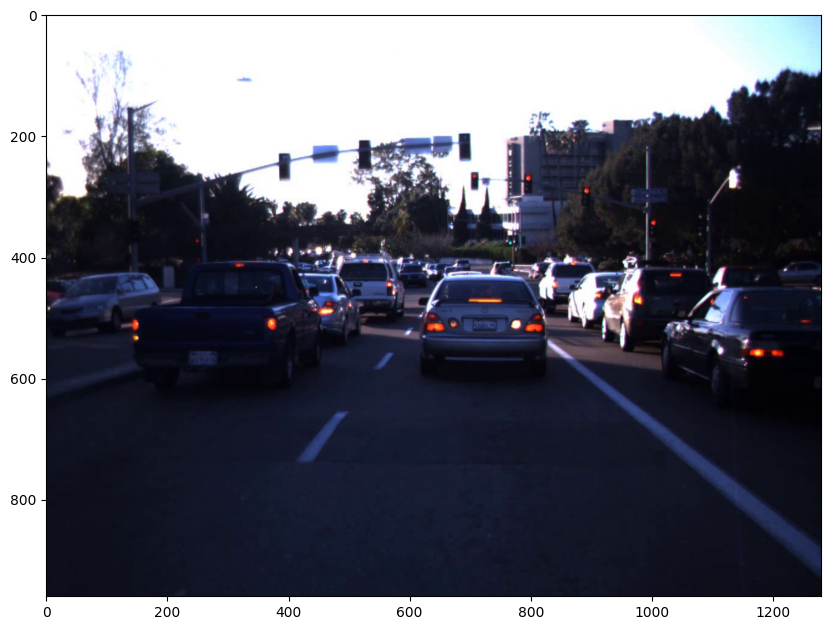

In [37]:
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/kaggle/working/mmdetection/lisa_train/dayClip1--00190.jpg')
plt.figure(figsize=(10, 8))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

## pycocotools를 이용한 COCO 데이터 

In [38]:
dataDir='/kaggle/working/mmdetection/'
dataType='train'
annFile='{}{}.json'.format(dataDir,dataType)
print(annFile)

/kaggle/working/mmdetection/train.json


**coco 객체 생성**

In [39]:
from pycocotools.coco import COCO

# COCO 데이터셋의 어노테이션 파일을 통해 coco 객체 초기화

coco = COCO(annFile)

loading annotations into memory...
Done (t=0.31s)
creating index...
index created!


**category 정보**

In [40]:
# getCatIds(): COCO 데이터셋의 모든 category_id 값을 리스트 형태로 반환
print(coco.getCatIds())
print(len(coco.getCatIds()))

[1, 2, 3, 4]
4


In [41]:
#loadCats() : category_id들을 리스트로 입력받아  category들에 대한 세부 정보 반환
cats = coco.loadCats(coco.getCatIds())
cats

[{'supercategory': '', 'id': 1, 'name': 'go'},
 {'supercategory': '', 'id': 2, 'name': 'stop'},
 {'supercategory': '', 'id': 3, 'name': 'warning'},
 {'supercategory': '', 'id': 4, 'name': 'goLeft'}]

In [42]:
# coco.getCatIds()는 모든 category_id 리스트 반환
# coco.getCatIds(catIds=이름)는 지정된 이름에 대한 category id 반환

catIds = coco.getCatIds(catNms=['go'])
catIds

[1]

**image 정보**

In [ ]:
# coco.getImgIds(catIds=catIds) : 해당 catogory_id별로 한개의 image id을 임의로 출력
imgIds = coco.getImgIds(catIds=catIds)
imgIds

In [44]:
#loadImgs(ids=imgIds) : 인자로 들어온 image id들에 대한 상세 정보 반환
imgs = coco.loadImgs(ids=imgIds)
len(imgs)

931

In [45]:
# 개별 image id로 상세 정보 추출
imgId = imgIds[7] # 15
img = coco.loadImgs(ids=imgId) # 한 이미지에 대한 상세 정보
img

[{'license': 1,
  'file_name': 'dayClip7--01920.jpg',
  'height': 960,
  'width': 1280,
  'id': 15}]

## 데이터 시각화

In [46]:
img = img[0]
img['file_name']

'dayClip7--01920.jpg'

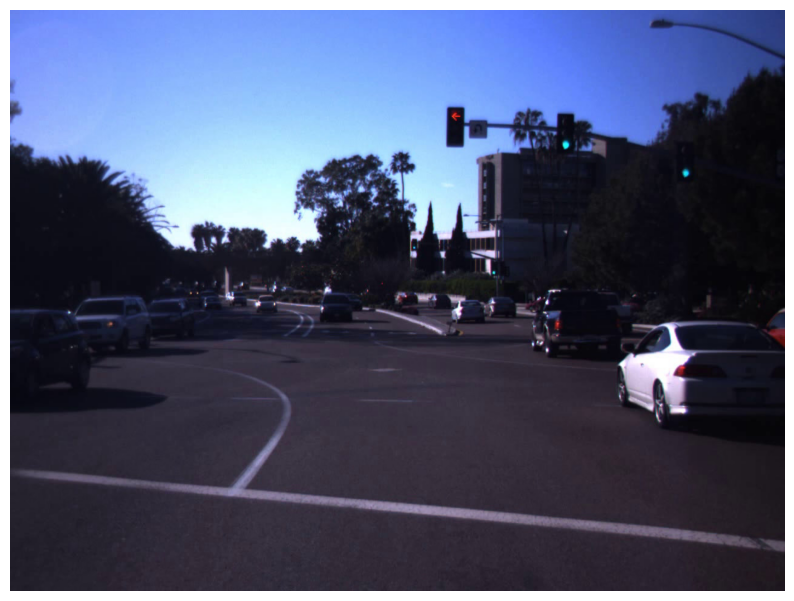

In [47]:
import cv2
import matplotlib.pyplot as plt
import pylab
%matplotlib inline

file_path = '/kaggle/working/mmdetection/lisa_train/' + img['file_name']

image = cv2.imread(file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.axis('off')
plt.imshow(image)
plt.show()

In [48]:
# getAnnIds() : 해당 image의 annotation을 가져오기
# 한 image는 여러 annotation 정보가 있음
coco.getAnnIds(imgIds=img['id'])

[3179, 3180, 3181]

In [49]:
# 위의 코드에 catIds를 추가로 지정해 주면 해당 category의 annotation만 가져옴
catIds = coco.getCatIds(catNms=['go']) # 1
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds)
annIds

[3179, 3180]

In [50]:
anns = coco.loadAnns(annIds)
len(anns)

2

In [51]:
ann0_4seg= anns[0]['segmentation'][0]
ann0_4seg[:4] # x, y 좌표

[901, 163, 934, 163]

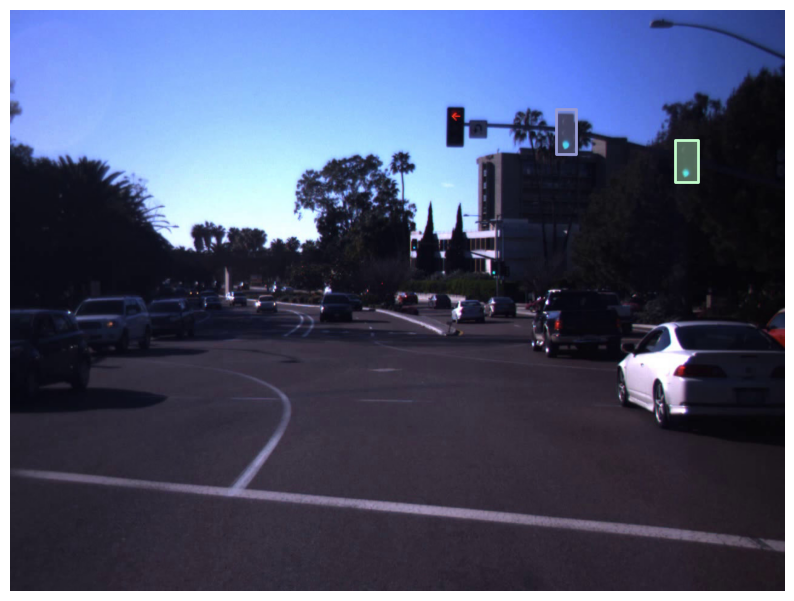

In [52]:
# showAnns() : annotation 정보들을 입력받아서 시각화 
# 단, matplotlib으로 시각화 할 수 있는 이미지 배열이 로드되어 있어야 함
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.axis('off')
coco.showAnns(anns)

## lisa-traffic-light Dataset을 COCO Format으로 변환하기

In [53]:
from mmdet.datasets.builder import DATASETS
from mmdet.datasets.coco import CocoDataset

@DATASETS.register_module(force=True) # 데코레이터를 통해 VOCDataset을 MMDetection FWK에 등록, 재등록 실패시 (force=True)
class LisaDataset(CocoDataset):   
  CLASSES = ('go', 'stop', 'warning', 'goLeft')

**config 파일 수정하기**

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/mask_rcnn/mask_rcnn_r101_fpn_1x_coco.py')
print(f'Config:\n{cfg.pretty_text}')

**mask_rcnn pretrained model**

In [55]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_fpn_1x_coco/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth \
      -O checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth

--2023-05-17 08:46:12--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_fpn_1x_coco/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 8.25.82.208, 8.25.82.209, 8.25.82.214, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|8.25.82.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 254089599 (242M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth’

checkpoints/mask_rc 100%[===================>] 242.32M  9.41MB/s    in 26s     

2023-05-17 08:46:39 (9.21 MB/s) - ‘checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth’ saved [254089599/254089599]



In [67]:
# 학습 수행후 모델 checkpoint 저장할 공간 연결
# !mkdir /content/drive/MyDrive/lisa_log

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'LisaDataset'
cfg.data_root = '/kaggle/working/mmdetection/'

cfg.data.test.type = 'LisaDataset'
cfg.data.test.data_root = '/kaggle/working/mmdetection/'
cfg.data.test.ann_file = 'test.json'
cfg.data.test.img_prefix = 'lisa_test'


cfg.data.train.type = 'LisaDataset'
cfg.data.train.data_root = '/kaggle/working/mmdetection/'
cfg.data.train.ann_file = 'train.json'
cfg.data.train.img_prefix = 'lisa_train'

cfg.data.val.type = 'LisaDataset'
cfg.data.val.data_root = '/kaggle/working/mmdetection/'
cfg.data.val.ann_file = 'val.json'
cfg.data.val.img_prefix = 'lisa_val'


# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 4
cfg.model.roi_head.mask_head.num_classes = 4

# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth'

# Set up working dir to save files and logs.
# cfg.work_dir = '/content/drive/MyDrive/lisa_log'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
# cfg.lr_config.warmup = None
cfg.log_config.interval = 80

# max epochs 12 
cfg.runner.max_epochs = 5 # 기본값 변경시에만 설정

# 학습 시 Batch size 설정(단일 GPU 별 Batch size로 설정됨)
# samples_per_gpu 2 
# cfg.data.samples_per_gpu = 2 # 기본값 변경시에만설정

# Change the evaluation metric since we use customized dataset.
# note.
# detection evaluation에 map를 설정하면 iou가 0.5 일때만
# cocodata로 detection 할 때는 bbox를 설정해야 다양한 iou 기준 출력
# cocodata로 segmentation 할때는 bbox, segm을 지정
# CocoDataset의 경우 metric을 bbox로 설정해야 함.(mAP아님. bbox로 설정하면 mAP를 iou threshold를 0.5 ~ 0.95까지 변경하면서 측정)
cfg.evaluation.metric = ['bbox', 'segm']

# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 80
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 80

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.device = 'cuda'
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

**Config에서 설정한 Lisa Dataset 적용**

In [57]:
from mmdet.datasets import build_dataset

# Build dataset
train_dataset, test_dataset = [build_dataset(cfg.data.train), build_dataset(cfg.data.test)]

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.29s)
creating index...
index created!


In [58]:
train_dataset # 1803개의 train imgage


LisaDataset Train dataset with number of images 1803, and instance counts: 
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| category | count | category | count | category    | count | category   | count | category      | count |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| 0 [go]   | 2315  | 1 [stop] | 2609  | 2 [warning] | 160   | 3 [goLeft] | 122   | -1 background | 0     |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+

In [59]:
test_dataset # 1019개의 test imgage


LisaDataset Train dataset with number of images 1019, and instance counts: 
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| category | count | category | count | category    | count | category   | count | category      | count |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| 0 [go]   | 1807  | 1 [stop] | 1204  | 2 [warning] | 64    | 3 [goLeft] | 49    | -1 background | 0     |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+

**Config에서 설정한 모델 적용**

In [60]:
from mmdet.models import build_detector

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = train_dataset.CLASSES

## 학습 수행

In [73]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [74]:
# from mmdet.apis import train_detector

# # Create work_dir
# mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))
# train_detector(model, train_dataset, cfg, distributed=False, validate=True) # validate=True : validation 데이터로 evaluation

## 학습된 모델로 예측하기

**이미지 한 장 예측**

In [61]:
from mmdet.apis import init_detector, inference_detector

load checkpoint from local path: /kaggle/working/mmdetection/epoch_5.pth


/kaggle/working/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


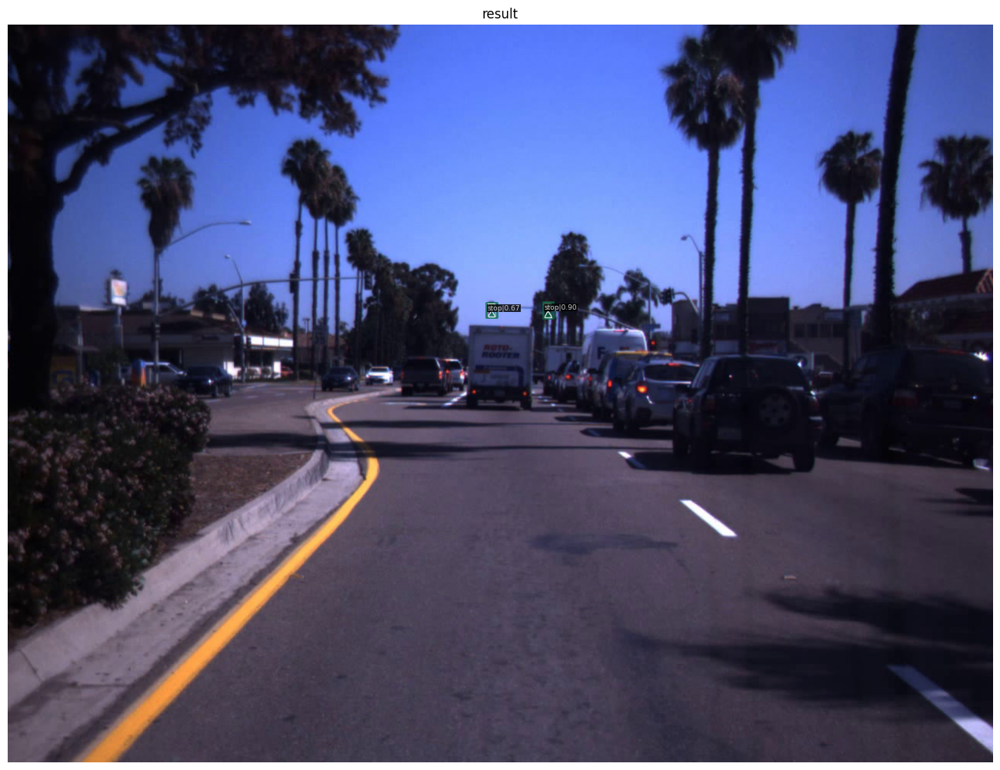

In [62]:
from mmdet.apis import show_result_pyplot

# 저장된 모델로 이미지 예측
checkpoint_file = '/kaggle/working/mmdetection/epoch_5.pth'

model_ckpt = init_detector(cfg, checkpoint_file, device='cuda:0')
img = mmcv.imread('/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00938.jpg') # BGR Image 사용 

result = inference_detector(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, score_thr=0.4)

In [63]:
len(result), type(result[0]), type(result[1])

(2, list, list)

In [64]:
len(result[0]), len(result[1])

(4, 4)

In [65]:
result[1]

[[],
 [array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]])],
 [],
 []]

In [66]:
result[0]

[array([], shape=(0, 5), dtype=float32),
 array([[6.9544238e+02, 3.6195963e+02, 7.0887451e+02, 3.8228705e+02,
         9.0454662e-01],
        [6.2198944e+02, 3.6219345e+02, 6.3565643e+02, 3.8195670e+02,
         6.6754168e-01]], dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32)]

**이미지 여러 장 예측**

In [67]:
test_img_paths = test_df['Filename']
test_img_paths

7              /kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00150.jpg
24             /kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg
25             /kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg
44             /kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg
45             /kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg
                                                          ...                                                   
21097    /kaggle/input/lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--06530.jpg
21098    /kaggle/input/lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--06530.jpg
21099    /kaggle/input/lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequ

In [68]:
test_imgs = [mmcv.imread(x) for x in test_img_paths[:20]]

In [69]:
len(test_imgs), test_imgs[0].shape

(20, (960, 1280, 3))

In [70]:
test_df.head(6)

,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number,isNight
7,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00150.jpg,stop,1004,349,1019,376,150,0
24,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,946,391,958,409,160,0
25,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,834,345,852,372,160,0
44,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg,stop,723,340,741,367,170,0
45,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg,stop,835,380,853,420,170,0
62,/kaggle/input/lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00180.jpg,stop,780,375,792,406,180,0


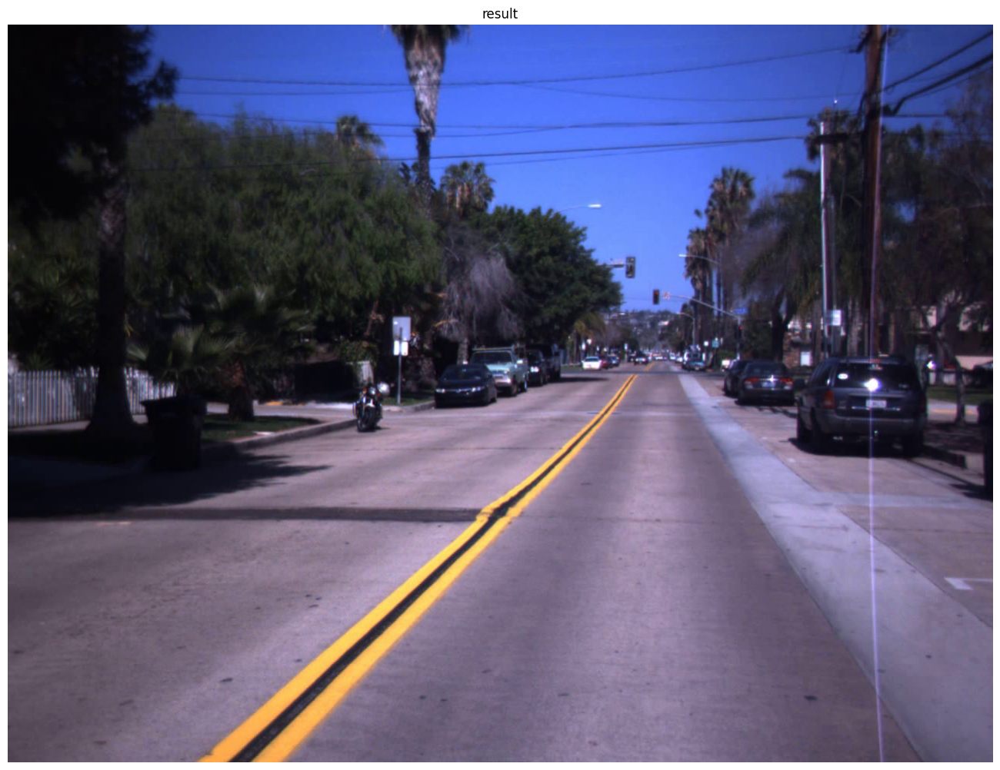

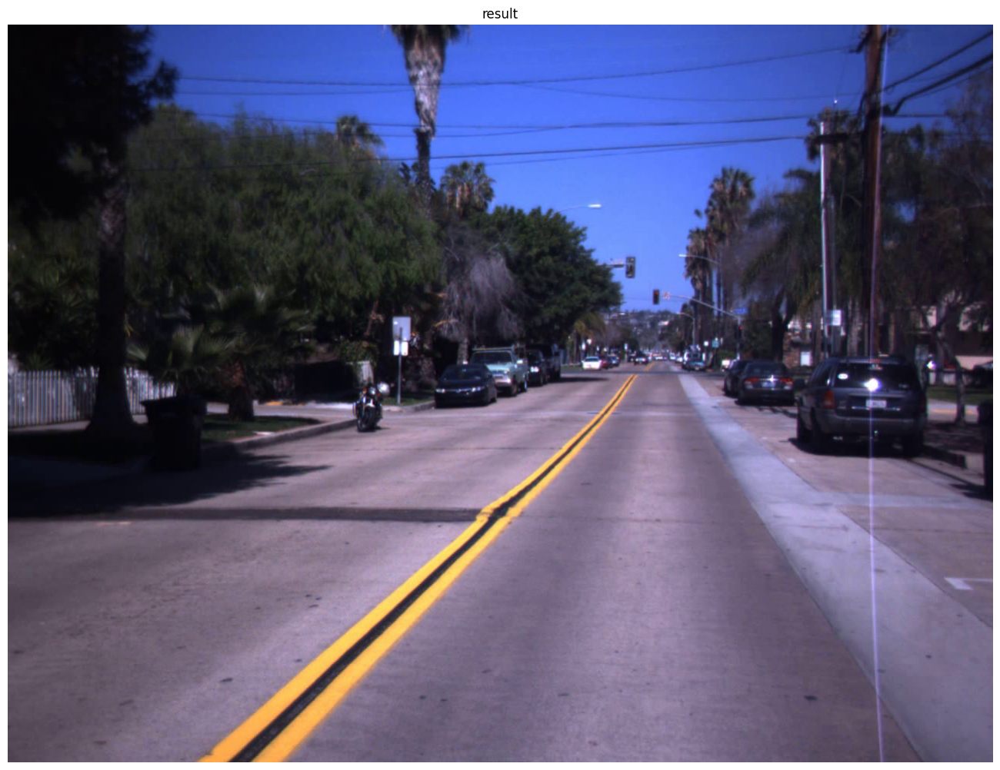

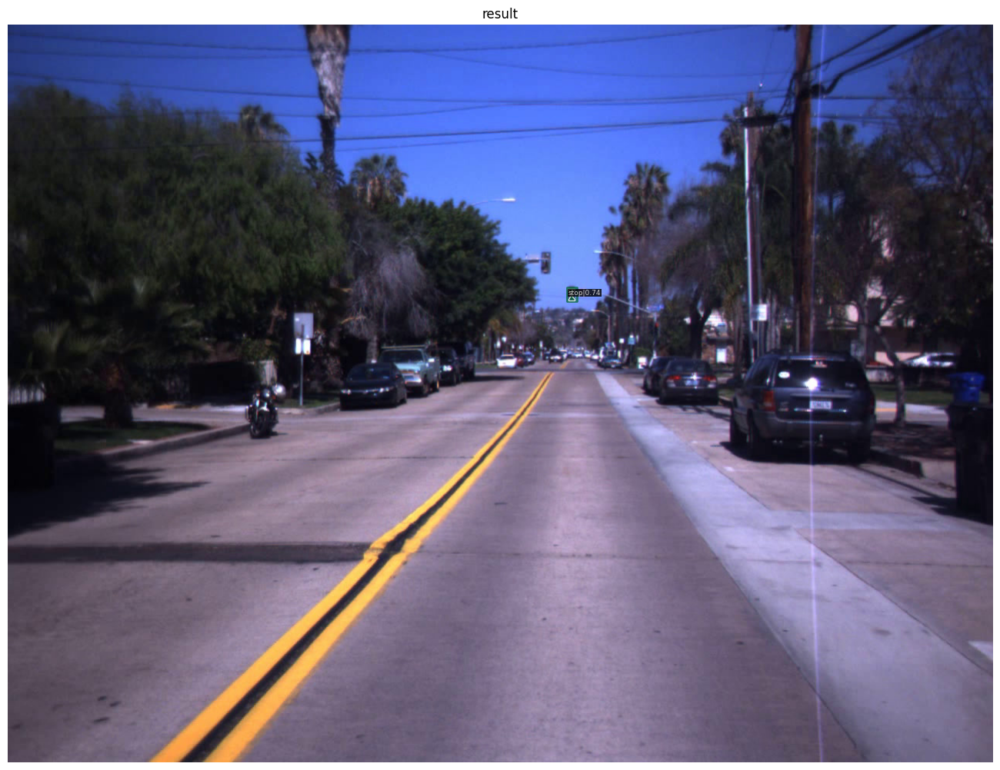

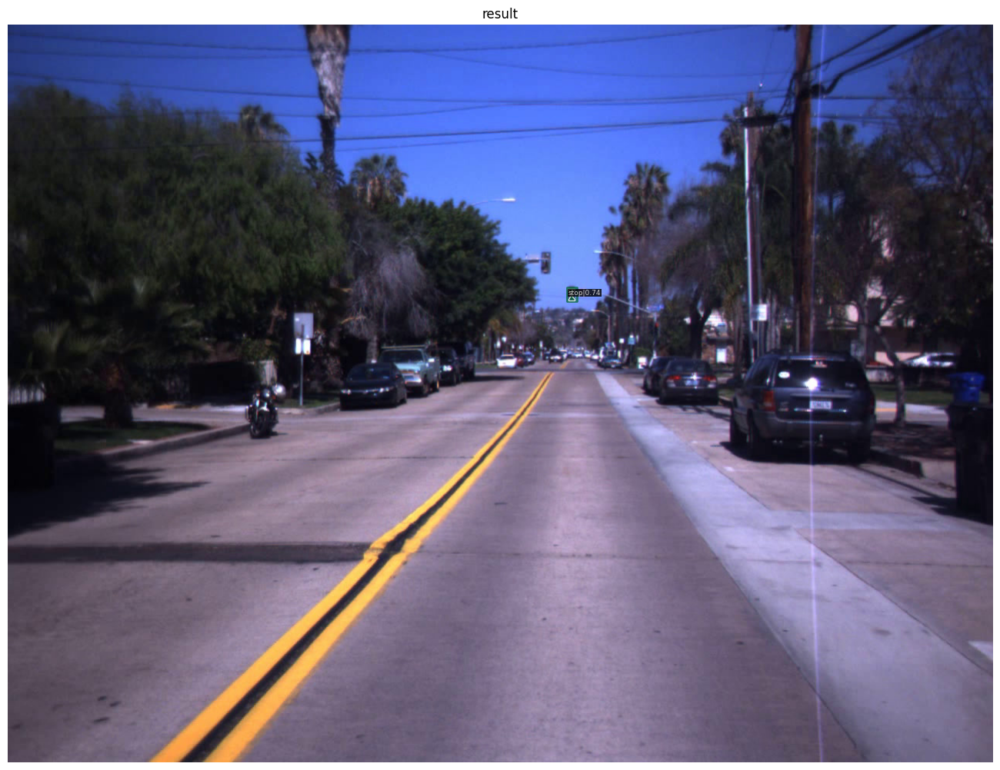

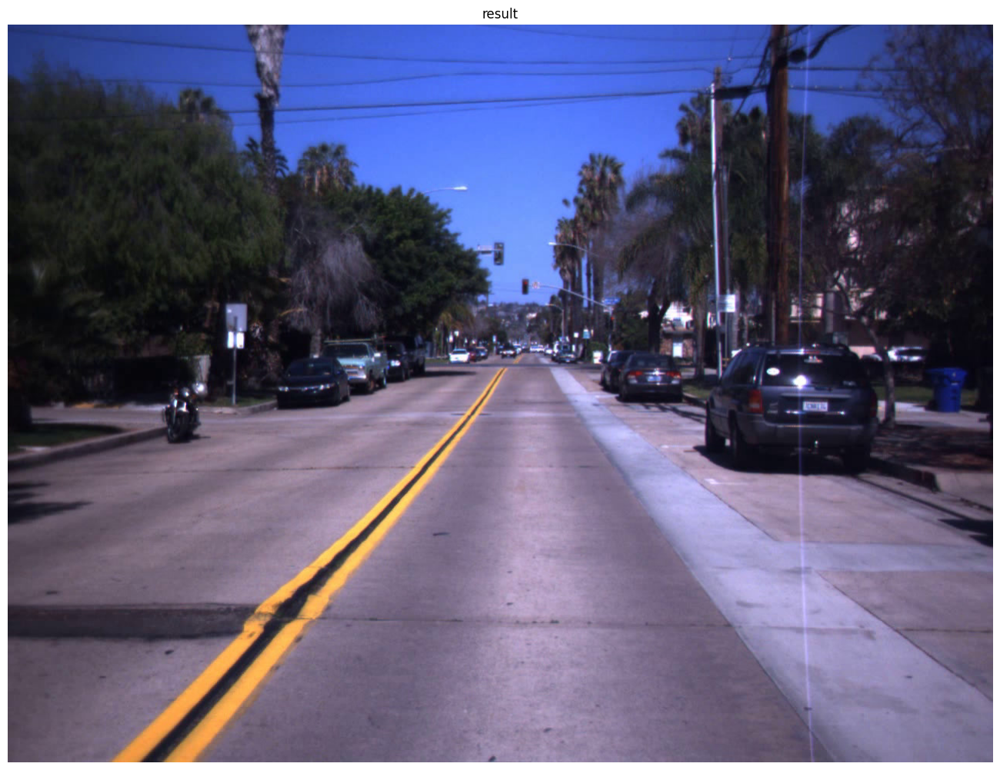

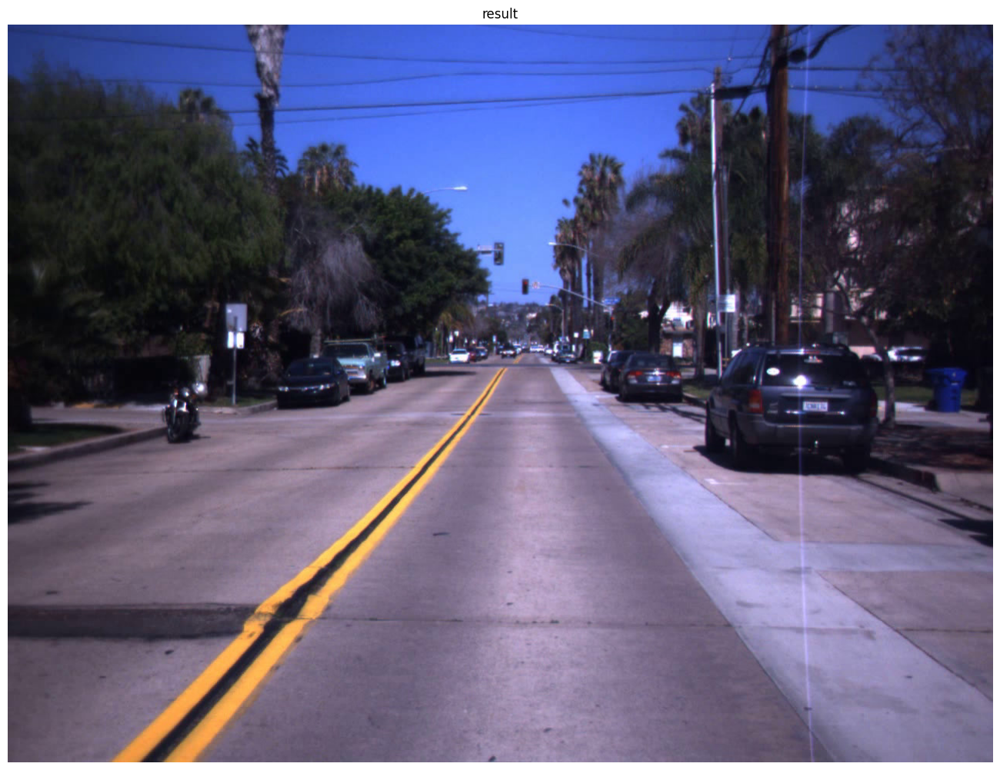

In [71]:
for i in range(1, 7):
  result = inference_detector(model_ckpt, test_imgs[i])
  show_result_pyplot(model_ckpt, test_imgs[i], result, score_thr=0.4)

## 모델 평가

In [72]:
test_dataset


LisaDataset Train dataset with number of images 1019, and instance counts: 
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| category | count | category | count | category    | count | category   | count | category      | count |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| 0 [go]   | 1807  | 1 [stop] | 1204  | 2 [warning] | 64    | 3 [goLeft] | 49    | -1 background | 0     |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+

In [73]:
from mmdet.datasets import build_dataloader, build_dataset

# test용 Dataset과 DataLoader 생성
data_loader = build_dataloader(
        test_dataset,
        samples_per_gpu=1, #cfg.data.samples_per_gpu,
        workers_per_gpu=cfg.data.workers_per_gpu,
        dist=False,
        shuffle=False)

x = next(iter(data_loader))

In [74]:
!mkdir show_test_output

In [75]:
x['img']

[tensor([[[[-1.5185, -1.5185, -1.5014,  ...,  0.0000,  0.0000,  0.0000],
           [-1.5185, -1.5185, -1.5014,  ...,  0.0000,  0.0000,  0.0000],
           [-1.5185, -1.5185, -1.5014,  ...,  0.0000,  0.0000,  0.0000],
           ...,
           [-1.4158, -1.4158, -1.4158,  ...,  0.0000,  0.0000,  0.0000],
           [-1.4158, -1.4158, -1.4158,  ...,  0.0000,  0.0000,  0.0000],
           [-1.4158, -1.4158, -1.4158,  ...,  0.0000,  0.0000,  0.0000]],
 
          [[-1.0903, -1.0903, -1.1078,  ...,  0.0000,  0.0000,  0.0000],
           [-1.0903, -1.0903, -1.1078,  ...,  0.0000,  0.0000,  0.0000],
           [-1.0903, -1.0903, -1.1078,  ...,  0.0000,  0.0000,  0.0000],
           ...,
           [-1.3704, -1.3704, -1.3704,  ...,  0.0000,  0.0000,  0.0000],
           [-1.3704, -1.3704, -1.3704,  ...,  0.0000,  0.0000,  0.0000],
           [-1.3704, -1.3704, -1.3704,  ...,  0.0000,  0.0000,  0.0000]],
 
          [[ 0.3393,  0.3393,  0.3219,  ...,  0.0000,  0.0000,  0.0000],
           [ 

In [76]:
from mmdet.apis import single_gpu_test
from mmdet.utils import build_dp

# 위에서 만든 /content/show_test_output 디렉토리에 예측 결과 이미지가 저장
model_ckpt = build_dp(model_ckpt, cfg.device, device_ids=cfg.gpu_ids)
results = single_gpu_test(model_ckpt, data_loader, True, '/content/show_test_output', 0.3)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1019/1019, 2.9 task/s, elapsed: 353s, ETA:     0s

In [77]:
metric = test_dataset.evaluate(results, metric=['bbox', 'segm'])
print(metric)


Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.29s).

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95

/kaggle/working/mmdetection/mmdet/datasets/coco.py:470: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  warnings.warn(


DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.26s).

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | 